# Assignment 2: Spatial Domain Image Transformations

## Imports & Helper Functions

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def show_image(image, dpi=100):
    height, width = image.shape[:2]
    fig = plt.figure(
        figsize=(width / dpi, height / dpi),
        dpi=dpi
    )
    ax = fig.add_axes([0, 0, 1, 1])
    if image.ndim == 3 and image.shape[2] == 3:
        ax.imshow(image, interpolation='none')
    else:
        ax.imshow(image, cmap='gray', interpolation='none')
    ax.axis('off')
    plt.show()

## Task 1: Directional Unsharp Masking

### 1.1 Filter Design & Visualisation

Design a Gaussian smoothing filter
that performs directional smoothing to facilitate vertical edge sharpening using highboost
filtering

- Construct an anisotropic 2D Gaussian kernel of size . The smaller61 × 61 standard deviation is set to , and the ratio of the larger standard deviation σ = 0.5 to the smaller one is . Determine whether the kernel needs to be oriented 40:1 horizontally or vertically to enhance vertical edges.
- Plot the level sets (contour plot) and display the heatmap of the designed Gaussian kernel.

In [3]:
# kernel parameters
kernel_size = 61
k = (kernel_size - 1) // 2

sigma_small = 0.5
sigma_large = 20.0

# sigma_x = sigma_large (horizontal blur) and sigma_y = sigma_small (minimal vertical blur)
sigma_x = sigma_large
sigma_y = sigma_small

# Create grid of coordinates centered at (0, 0)
y, x = np.ogrid[-k:k+1, -k:k+1]

# 2D Anisotropic Gaussian Formula
gaussian_kernel = np.exp(-((x**2 / (2.0 * sigma_x**2)) + (y**2 / (2.0 * sigma_y**2))))
gaussian_kernel /= np.sum(gaussian_kernel)  # Normalize sum to 1

print(f"Kernel Shape: {gaussian_kernel.shape}")
print(f"Kernel Sum: {np.sum(gaussian_kernel):.6f}")
print(f"Sigma X (Horizontal): {sigma_x}, Sigma Y (Vertical): {sigma_y}")

Kernel Shape: (61, 61)
Kernel Sum: 1.000000
Sigma X (Horizontal): 20.0, Sigma Y (Vertical): 0.5


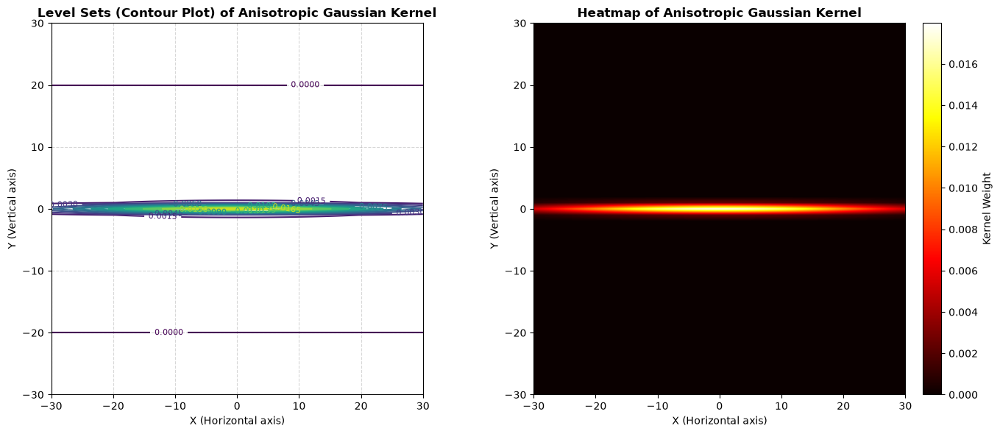

In [4]:
# Plotting: Level Sets (Contour Plot) and Heatmap
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Grid coordinates for plotting
x_coords = np.arange(-k, k + 1)
y_coords = np.arange(-k, k + 1)
X, Y = np.meshgrid(x_coords, y_coords)

# 1. Level Sets (Contour Plot)
ax1 = axes[0]
contour = ax1.contour(X, Y, gaussian_kernel, levels=12, cmap='viridis')
ax1.clabel(contour, inline=True, fontsize=8, fmt='%.4f')
ax1.set_title("Level Sets (Contour Plot) of Anisotropic Gaussian Kernel", fontsize=12, fontweight='bold')
ax1.set_xlabel("X (Horizontal axis)")
ax1.set_ylabel("Y (Vertical axis)")
ax1.set_aspect('equal')
ax1.grid(True, linestyle='--', alpha=0.5)

# 2. Heatmap
ax2 = axes[1]
im = ax2.imshow(gaussian_kernel, extent=[-k, k, -k, k], origin='lower', cmap='hot', interpolation='bilinear')
fig.colorbar(im, ax=ax2, label='Kernel Weight', fraction=0.046, pad=0.04)
ax2.set_title("Heatmap of Anisotropic Gaussian Kernel", fontsize=12, fontweight='bold')
ax2.set_xlabel("X (Horizontal axis)")
ax2.set_ylabel("Y (Vertical axis)")

plt.tight_layout()
plt.show()

### 1.2 Spatial Filtering

Perform 2D convolution on the input image using cv2.filter2D() with your custom anisotropic kernel. Display the filtered (blurred) output.

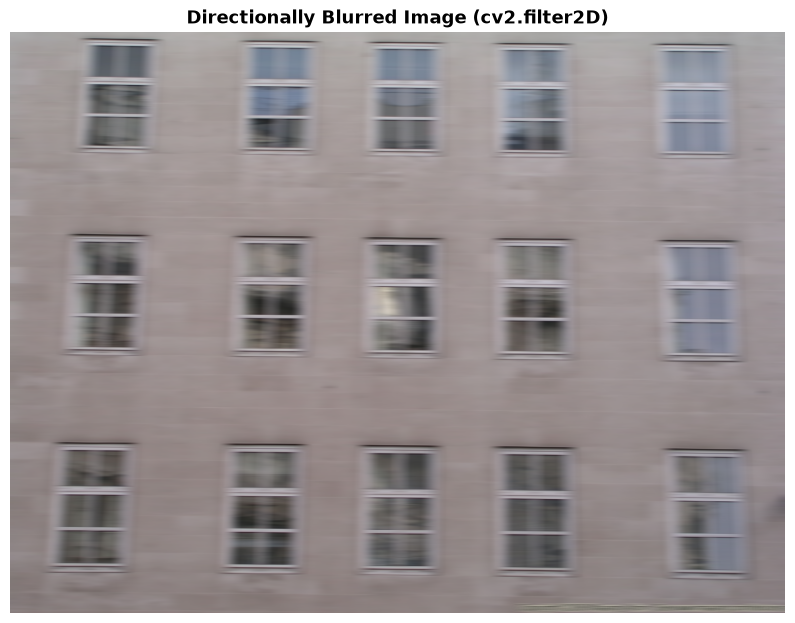

In [ ]:
# Load input image
image_one_bgr = cv2.imread('image_one.jpg')
image_one_rgb = cv2.cvtColor(image_one_bgr, cv2.COLOR_BGR2RGB)

# Perform 2D convolution with custom anisotropic kernel
blurred_image_rgb = cv2.filter2D(image_one_rgb, -1, gaussian_kernel)

# Display blurred output
plt.figure(figsize=(10, 8))
plt.imshow(blurred_image_rgb)
plt.title("Directionally Blurred Image", fontsize=13, fontweight='bold')
plt.axis('off')
plt.show()

### 1.3 Unsharp Masking & High Boost Filtering

- Compute the unsharp mask: 𝑀𝑎𝑠𝑘 = 𝐼𝑛𝑝𝑢𝑡𝐼𝑚𝑎𝑔𝑒 − 𝐵𝑙𝑢𝑟𝑟𝑒𝑑𝐼𝑚𝑎𝑔𝑒
- Apply high boost filtering: 𝑆ℎ𝑎𝑟𝑝𝑒𝑛𝑒𝑑𝐼𝑚𝑎𝑔𝑒 = 𝐼𝑛𝑝𝑢𝑡𝐼𝑚𝑎𝑔𝑒 + 𝑘 × 𝑀𝑎𝑠𝑘. use 𝑘 = 1.5
- Display both the isolated mask and the final sharpened image. Briefly explain why vertical edges are sharpened while horizontal edges remain unaffected.

In [6]:
# Convert to float64
input_float = image_one_rgb.astype(np.float64)
blurred_float = blurred_image_rgb.astype(np.float64)

# Compute Unsharp Mask
unsharp_mask = input_float - blurred_float

# Apply High Boost Filtering (k = 1.5)
k_boost = 1.5
sharpened_float = input_float + k_boost * unsharp_mask

# Clip to valid dynamic range [0, 255] and convert back to uint8
sharpened_image_rgb = np.clip(sharpened_float, 0, 255).astype(np.uint8)

# Normalized mask for display (centered around 128)
mask_display = np.clip(unsharp_mask + 128.0, 0, 255).astype(np.uint8)

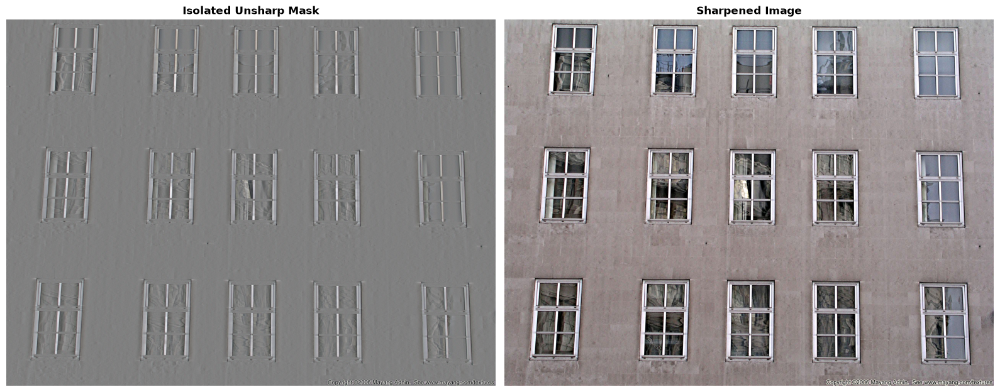

In [7]:
# Display Isolated Mask and Final Sharpened Image
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

axes[0].imshow(mask_display)
axes[0].set_title("Isolated Unsharp Mask", fontsize=12, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(sharpened_image_rgb)
axes[1].set_title(f"Sharpened Image", fontsize=12, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.show()

#### Explanation: Why vertical edges are sharpened while horizontal edges remain unaffected
1. **Directional Convolution Properties:** The anisotropic Gaussian kernel has $\sigma_x = 20.0$ along the horizontal axis and $\sigma_y = 0.5$ along the vertical axis.
2. **Vertical Edge Response:** A vertical edge has a sharp intensity gradient along the horizontal ($x$) direction. Because $\sigma_x$ is large, horizontal filtering significantly blurs across the vertical boundary, creating a notable difference between the original and blurred pixel values ($|\text{Input} - \text{Blurred}| \gg 0$). Thus, the unsharp mask strongly captures vertical edges.
3. **Horizontal Edge Invariance:** A horizontal edge has an intensity gradient along the vertical ($y$) direction. Because $\sigma_y = 0.5$ is very small, virtually no blurring occurs vertically (the 1D kernel along $y$ is effectively an impulse). Consequently, $\text{Blurred} \approx \text{Input}$ across horizontal transitions, causing $\text{Mask} \approx 0$.
4. **High Boost Result:** When adding $k \times \text{Mask}$ back to the input, only vertical edges receive the boost, leaving horizontal edges intact.

## Task 2: Image Enhancement Transformations

### 2.1 Implementation & Selection

Analyse the contrast and intensity distribution of each provided image and apply one of the following techniques per image:
- Gamma Correction with γ < 1
- Gamma Correction with γ > 1
- Histogram Equalization

In [8]:
# Load all three images
image_two_bgr = cv2.imread('image_two.jpg')
image_two_rgb = cv2.cvtColor(image_two_bgr, cv2.COLOR_BGR2RGB)

image_three_bgr = cv2.imread('image_three.jpg')
image_three_rgb = cv2.cvtColor(image_three_bgr, cv2.COLOR_BGR2RGB)

image_four_bgr = cv2.imread('image_four.jpg')
image_four_rgb = cv2.cvtColor(image_four_bgr, cv2.COLOR_BGR2RGB)

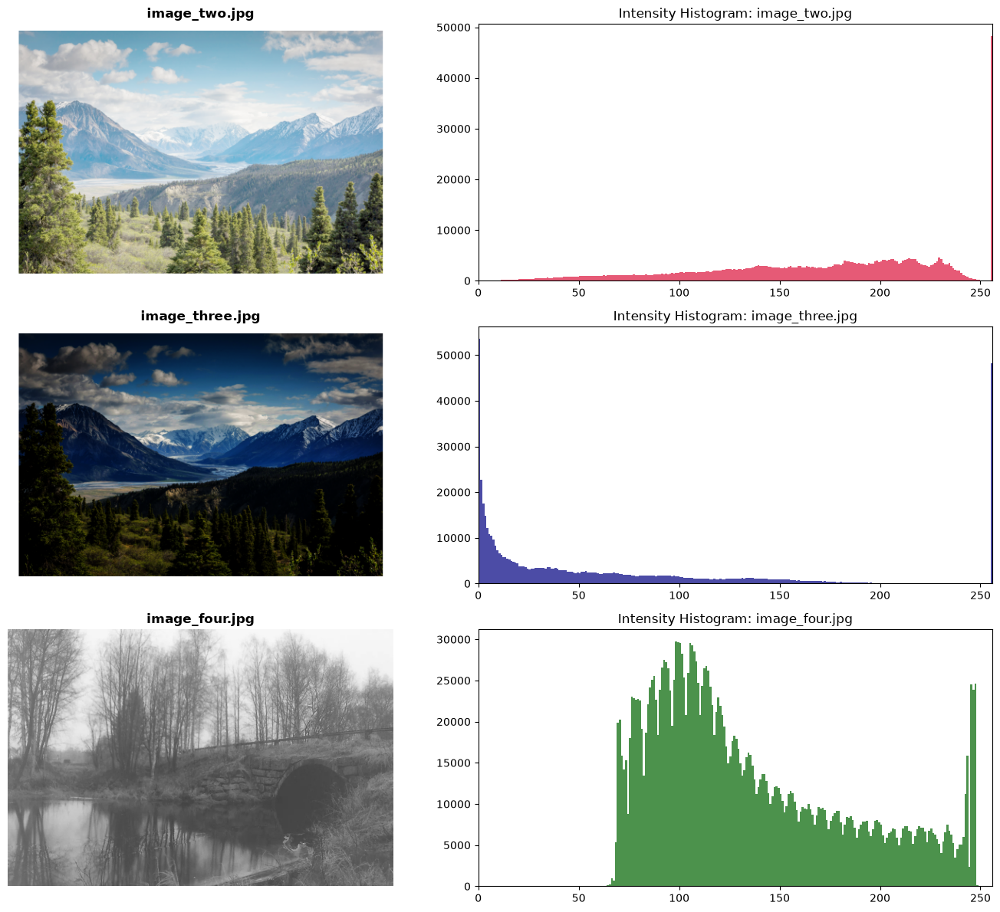

In [ ]:
# Display original images and their histograms
fig, axes = plt.subplots(3, 2, figsize=(14, 12))

# Image 2
axes[0, 0].imshow(image_two_rgb)
axes[0, 0].set_title("image_two.jpg", fontweight='bold')
axes[0, 0].axis('off')
axes[0, 1].hist(image_two_rgb.ravel(), bins=256, range=(0, 256), color='crimson', alpha=0.7)
axes[0, 1].set_title("Intensity Histogram: image_two.jpg")
axes[0, 1].set_xlim([0, 256])

# Image 3
axes[1, 0].imshow(image_three_rgb)
axes[1, 0].set_title("image_three.jpg", fontweight='bold')
axes[1, 0].axis('off')
axes[1, 1].hist(image_three_rgb.ravel(), bins=256, range=(0, 256), color='navy', alpha=0.7)
axes[1, 1].set_title("Intensity Histogram: image_three.jpg")
axes[1, 1].set_xlim([0, 256])

# Image 4
axes[2, 0].imshow(image_four_rgb)
axes[2, 0].set_title("image_four.jpg", fontweight='bold')
axes[2, 0].axis('off')
axes[2, 1].hist(image_four_rgb.ravel(), bins=256, range=(0, 256), color='darkgreen', alpha=0.7)
axes[2, 1].set_title("Intensity Histogram: image_four.jpg")
axes[2, 1].set_xlim([0, 256])

plt.tight_layout()
plt.show()

In [10]:
# Apply Enhancements

# Gamma Correction with gamma > 1 for image_two (gamma = 2.2)
gamma_two = 2.2
lut_two = np.array([((i / 255.0) ** gamma_two) * 255.0 for i in range(256)]).astype(np.uint8)
image_two_enhanced = cv2.LUT(image_two_rgb, lut_two)

# Gamma Correction with gamma < 1 for image_three (gamma = 0.45)
gamma_three = 0.45
lut_three = np.array([((i / 255.0) ** gamma_three) * 255.0 for i in range(256)]).astype(np.uint8)
image_three_enhanced = cv2.LUT(image_three_rgb, lut_three)

# Histogram Equalization for image_four
image_four_ycrcb = cv2.cvtColor(image_four_rgb, cv2.COLOR_RGB2YCrCb)
image_four_ycrcb[:, :, 0] = cv2.equalizeHist(image_four_ycrcb[:, :, 0])
image_four_enhanced = cv2.cvtColor(image_four_ycrcb, cv2.COLOR_YCrCb2RGB)

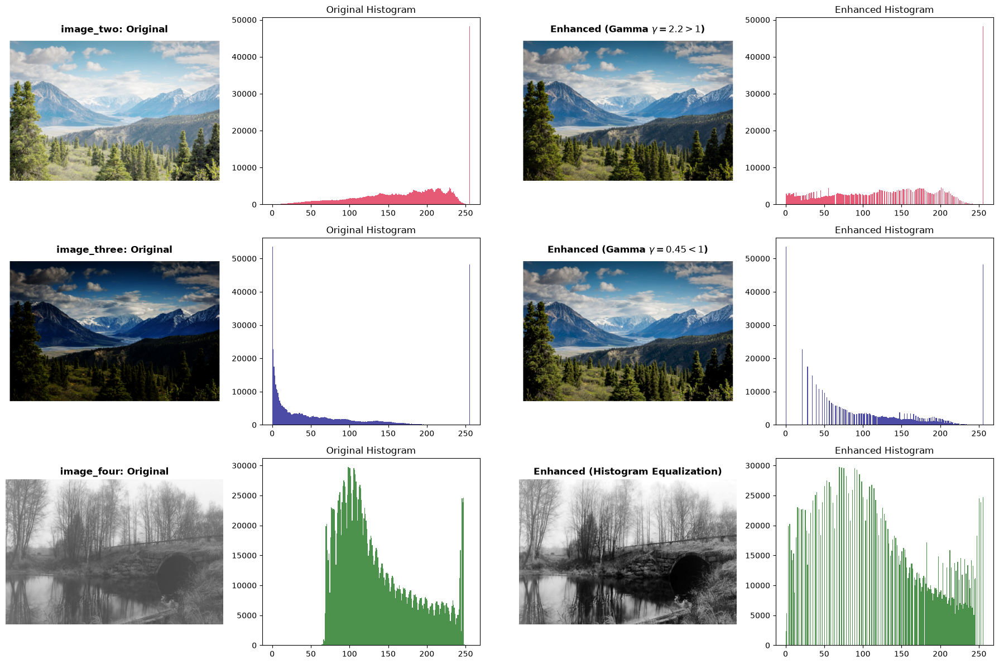

In [11]:
# Visualise Before vs After Comparisons with Histograms

fig, axes = plt.subplots(3, 4, figsize=(18, 12))

# Image 2: Gamma > 1
axes[0, 0].imshow(image_two_rgb)
axes[0, 0].set_title("image_two: Original", fontweight='bold')
axes[0, 0].axis('off')
axes[0, 1].hist(image_two_rgb.ravel(), bins=256, range=(0, 256), color='crimson', alpha=0.7)
axes[0, 1].set_title("Original Histogram")
axes[0, 2].imshow(image_two_enhanced)
axes[0, 2].set_title(f"Enhanced (Gamma $\\gamma = {gamma_two} > 1$)", fontweight='bold')
axes[0, 2].axis('off')
axes[0, 3].hist(image_two_enhanced.ravel(), bins=256, range=(0, 256), color='crimson', alpha=0.7)
axes[0, 3].set_title("Enhanced Histogram")

# Image 3: Gamma < 1
axes[1, 0].imshow(image_three_rgb)
axes[1, 0].set_title("image_three: Original", fontweight='bold')
axes[1, 0].axis('off')
axes[1, 1].hist(image_three_rgb.ravel(), bins=256, range=(0, 256), color='navy', alpha=0.7)
axes[1, 1].set_title("Original Histogram")
axes[1, 2].imshow(image_three_enhanced)
axes[1, 2].set_title(f"Enhanced (Gamma $\\gamma = {gamma_three} < 1$)", fontweight='bold')
axes[1, 2].axis('off')
axes[1, 3].hist(image_three_enhanced.ravel(), bins=256, range=(0, 256), color='navy', alpha=0.7)
axes[1, 3].set_title("Enhanced Histogram")

# Image 4: Histogram Equalization
axes[2, 0].imshow(image_four_rgb)
axes[2, 0].set_title("image_four: Original", fontweight='bold')
axes[2, 0].axis('off')
axes[2, 1].hist(image_four_rgb.ravel(), bins=256, range=(0, 256), color='darkgreen', alpha=0.7)
axes[2, 1].set_title("Original Histogram")
axes[2, 2].imshow(image_four_enhanced)
axes[2, 2].set_title("Enhanced (Histogram Equalization)", fontweight='bold')
axes[2, 2].axis('off')
axes[2, 3].hist(image_four_enhanced.ravel(), bins=256, range=(0, 256), color='darkgreen', alpha=0.7)
axes[2, 3].set_title("Enhanced Histogram")

plt.tight_layout()
plt.show()

## Task 3: Edge-Preserving Filtering for Color Images

### 3.1 Bilateral Filtering on Colour Image

Apply bilateral filtering to image_five (noisy RGB colour image). Compute spatial domain weights using spatial distance and range weights.

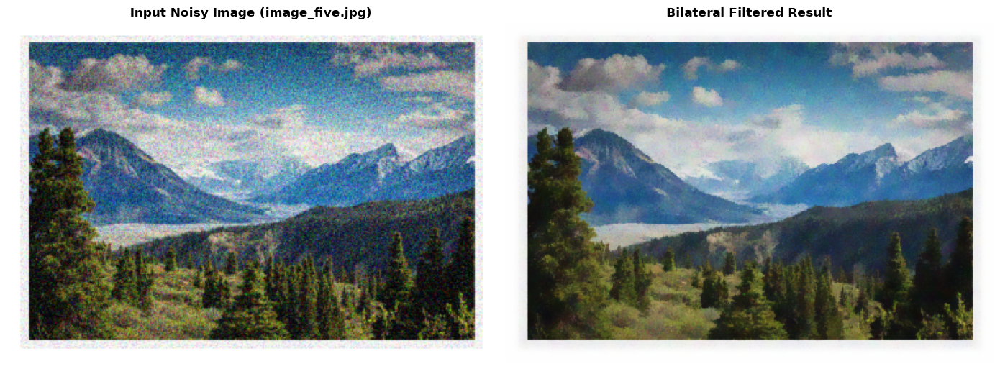

In [13]:
def bilateral_filter_rgb(image, d=9, sigma_color=35.0, sigma_space=5.0):
    image_f = image.astype(np.float64)
    h, w, c = image.shape
    radius = d // 2
    
    pad_img = np.pad(image_f, ((radius, radius), (radius, radius), (0, 0)), mode='reflect')
    
    filtered = np.zeros_like(image_f)
    w_sum = np.zeros((h, w, 1), dtype=np.float64)
    
    for dy in range(-radius, radius + 1):
        for dx in range(-radius, radius + 1):
            spatial_w = np.exp(-(dx**2 + dy**2) / (2.0 * sigma_space**2))
            
            neighbor = pad_img[radius + dy : radius + dy + h, radius + dx : radius + dx + w]
            color_dist_sq = np.sum((neighbor - image_f)**2, axis=2, keepdims=True)
            range_w = np.exp(-color_dist_sq / (2.0 * sigma_color**2))
            
            weight = spatial_w * range_w
            filtered += neighbor * weight
            w_sum += weight
            
    filtered /= (w_sum + 1e-12)
    return np.clip(filtered, 0, 255).astype(np.uint8)

# Load noisy image_five
image_five_bgr = cv2.imread('image_five.jpg')
image_five_rgb = cv2.cvtColor(image_five_bgr, cv2.COLOR_BGR2RGB)

# Apply Bilateral Filtering
d = 9
sigma_color = 35.0
sigma_space = 5.0

bilateral_result_rgb = bilateral_filter_rgb(
    image_five_rgb,
    d=d,
    sigma_color=sigma_color,
    sigma_space=sigma_space
)

# Display Bilateral Filtering Result
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(image_five_rgb)
axes[0].set_title("Input Noisy Image (image_five.jpg)", fontsize=12, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(bilateral_result_rgb)
axes[1].set_title(f"Bilateral Filtered Result", fontsize=12, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.show()

### 3.2 Joint Bilateral Filtering

Apply joint bilateral filtering to image_five using image_six as the guidance image. Compute range weights using intensity differences from image_six.

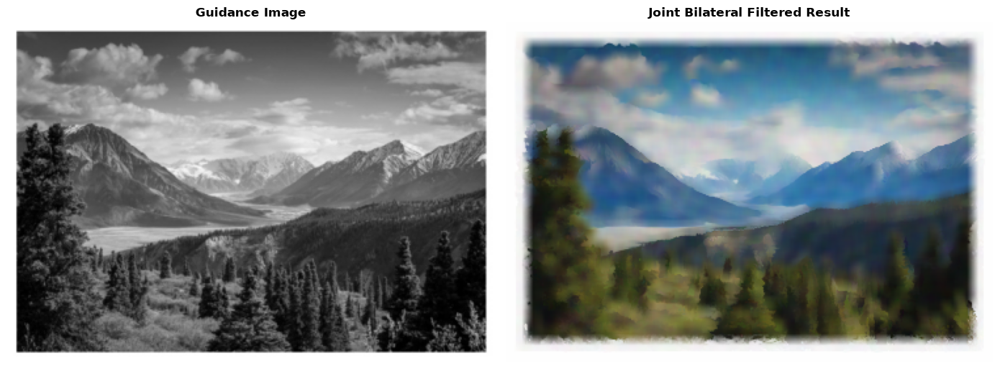

In [14]:
def joint_bilateral_filter_rgb(target_img, guide_img, d=9, sigma_color=35.0, sigma_space=5.0):
    target_f = target_img.astype(np.float64)
    guide_f = guide_img.astype(np.float64)
    h, w, c = target_img.shape
    radius = d // 2
    
    pad_target = np.pad(target_f, ((radius, radius), (radius, radius), (0, 0)), mode='reflect')
    pad_guide = np.pad(guide_f, ((radius, radius), (radius, radius), (0, 0)), mode='reflect')
    
    filtered = np.zeros_like(target_f)
    w_sum = np.zeros((h, w, 1), dtype=np.float64)
    
    for dy in range(-radius, radius + 1):
        for dx in range(-radius, radius + 1):
            spatial_w = np.exp(-(dx**2 + dy**2) / (2.0 * sigma_space**2))
            
            neighbor_target = pad_target[radius + dy : radius + dy + h, radius + dx : radius + dx + w]
            neighbor_guide = pad_guide[radius + dy : radius + dy + h, radius + dx : radius + dx + w]
            
            # Range weights derived from the guidance image
            guide_dist_sq = np.sum((neighbor_guide - guide_f)**2, axis=2, keepdims=True)
            range_w = np.exp(-guide_dist_sq / (2.0 * sigma_color**2))
            
            weight = spatial_w * range_w
            filtered += neighbor_target * weight
            w_sum += weight
            
    filtered /= (w_sum + 1e-12)
    return np.clip(filtered, 0, 255).astype(np.uint8)

# Load guidance image_six
image_six_bgr = cv2.imread('image_six.jpg')
image_six_rgb = cv2.cvtColor(image_six_bgr, cv2.COLOR_BGR2RGB)

# Resize guidance image to match target image dimensions if needed
h_target, w_target = image_five_rgb.shape[:2]
guide_resized_rgb = cv2.resize(image_six_rgb, (w_target, h_target), interpolation=cv2.INTER_AREA)

# Apply Joint Bilateral Filtering
joint_bilateral_result_rgb = joint_bilateral_filter_rgb(
    image_five_rgb,
    guide_resized_rgb,
    d=d,
    sigma_color=sigma_color,
    sigma_space=sigma_space
)

# Display Joint Bilateral Filtering Result
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(guide_resized_rgb)
axes[0].set_title("Guidance Image", fontsize=12, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(joint_bilateral_result_rgb)
axes[1].set_title(f"Joint Bilateral Filtered Result", fontsize=12, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.show()

### 3.3 Results and Analysis

Display the results from both filtering approaches and answer the following and explain the difference in the results of bilateral filtering and joint bilateral filtering.

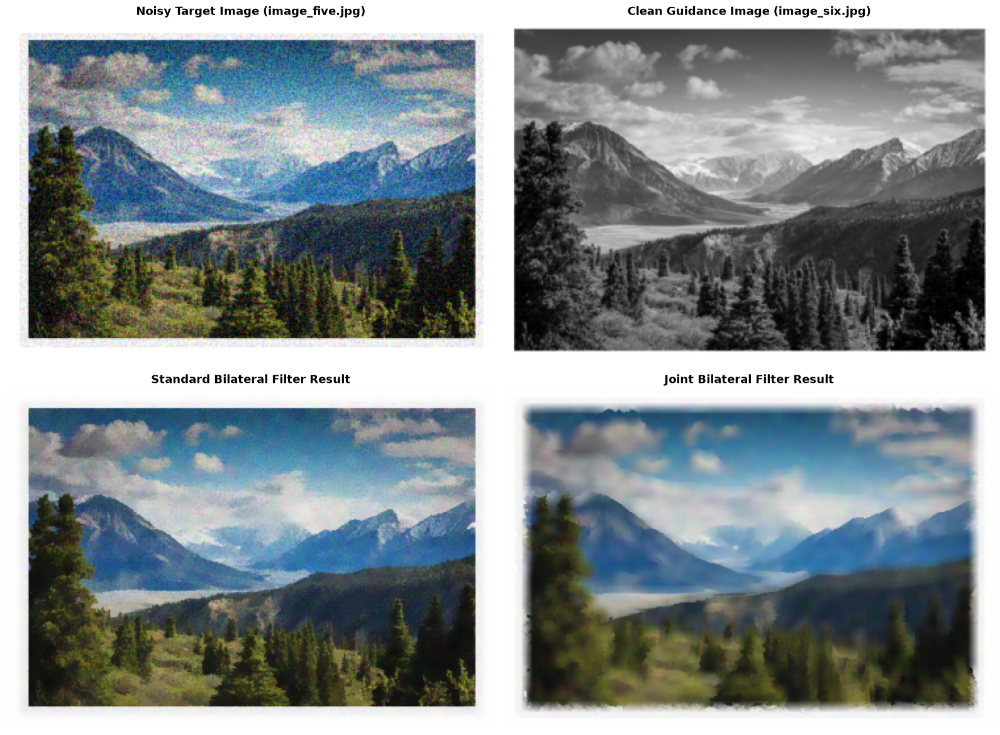

In [15]:
# Comprehensive Side-by-Side Comparison
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

axes[0, 0].imshow(image_five_rgb)
axes[0, 0].set_title("Noisy Target Image (image_five.jpg)", fontsize=13, fontweight='bold')
axes[0, 0].axis('off')

axes[0, 1].imshow(guide_resized_rgb)
axes[0, 1].set_title("Clean Guidance Image (image_six.jpg)", fontsize=13, fontweight='bold')
axes[0, 1].axis('off')

axes[1, 0].imshow(bilateral_result_rgb)
axes[1, 0].set_title("Standard Bilateral Filter Result", fontsize=13, fontweight='bold')
axes[1, 0].axis('off')

axes[1, 1].imshow(joint_bilateral_result_rgb)
axes[1, 1].set_title("Joint Bilateral Filter Result", fontsize=13, fontweight='bold')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

#### Analysis & Discussion of Differences:
   - **Standard Bilateral Filtering:** Calculates photometric differences $\|I(p) - I(q)\|$ directly on the noisy image `image_five.jpg`. High-amplitude noise spikes can produce large intensity differences between adjacent pixels of the same object. The filter misinterprets these noise spikes as true object edges, assigns them small weights, and consequently fails to average them out. This leaves residual grain/noise artifacts ("caviar" effect) in flat regions.
   - **Joint Bilateral Filtering:** Calculates photometric differences $\|G(p) - G(q)\|$ from the clean guidance image `image_six.jpg`. Because the guidance image is noise-free, flat regions consistently exhibit small intensity differences $\|G(p) - G(q)\| \approx 0$, allowing maximum spatial smoothing to completely eliminate noise in `image_five.jpg`.